#### Check service is ready

use `curl` on unix or just run url in browser

In [59]:
!curl https://detectron-model-ihj6i2l2aq-uc.a.run.app

Welcome to Books Prediction Application (Detectron2)

In [60]:
!curl https://detectron-model-ihj6i2l2aq-uc.a.run.app/hcheck

{"hostname": "pytorch-1-9-20210729-095901", "status": "success", "timestamp": 1628574609.550172, "results": [{"checker": "howami", "output": "I am alive. Thanks for checking..", "passed": true, "timestamp": 1628574609.5501435, "expires": 1628574636.5501435}, {"checker": "detectron_check", "output": "Detectron2 is available. Version == 0.5", "passed": true, "timestamp": 1628574609.5501492, "expires": 1628574636.5501492}]}

In [5]:
!curl https://detectron-model-ihj6i2l2aq-uc.a.run.app/hcheck

{"hostname": "localhost", "status": "success", "timestamp": 1628747969.8354218, "results": [{"checker": "howami", "output": "I am alive. Thanks for checking..", "passed": true, "timestamp": 1628747969.8353734, "expires": 1628747996.8353734}, {"checker": "detectron_check", "output": "Detectron2 is available. Version == 0.5", "passed": true, "timestamp": 1628747969.83538, "expires": 1628747996.83538}]}

#### Example 1. Get photo wit predicted segments

Wall time: 0 ns
200 OK


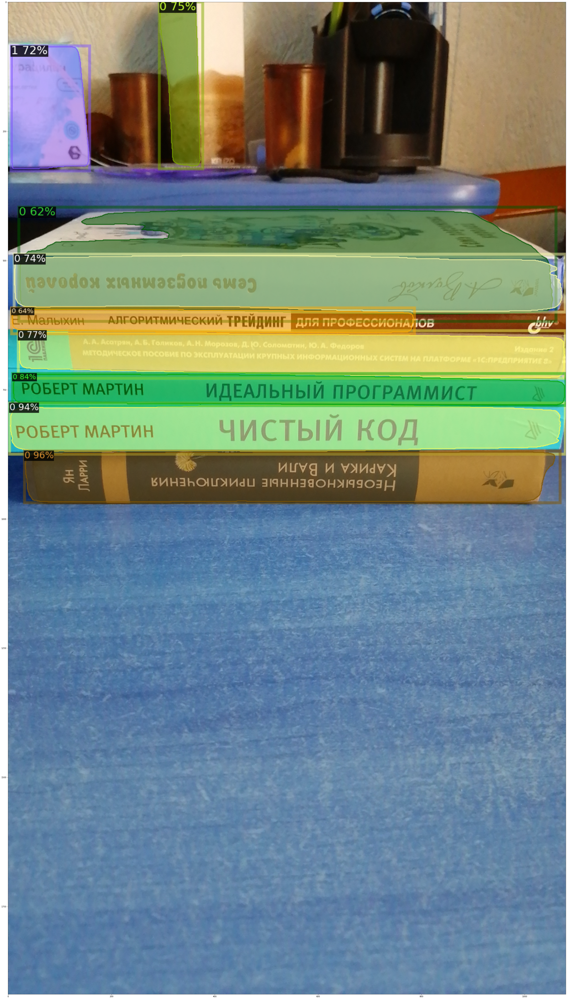

In [1]:
%time
import requests, shutil
from PIL import Image
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (50,100)

URL = 'https://detectron-model-ihj6i2l2aq-uc.a.run.app/predict'
TEST_PHOTO = 'test_photo.jpg'
PREDICTED_PHOTO = 'downloaded_photo.png'

rs = requests.post(URL, data={'output_data': 'photo'}, files={'photo': open(TEST_PHOTO, 'rb')}, stream=True)
print(rs.status_code, rs.reason)

with open(PREDICTED_PHOTO,"wb") as receive:
    shutil.copyfileobj(rs.raw,receive)
del rs

im = Image.open(PREDICTED_PHOTO)
plt.imshow(im);

#### Example 2. Get predicted masks (numpy array)

In [2]:
%time
import requests, shutil, joblib
import numpy as np

URL = 'https://detectron-model-ihj6i2l2aq-uc.a.run.app/predict'
TEST_PHOTO = 'test_photo.jpg'
PREDICTIONS_COMPRESSED_FILE = 'preds.download'

rs = requests.post(URL, data={'output_data': 'predicted_masks'}, files={'photo': open(TEST_PHOTO, 'rb')}, stream=True)
print(rs.status_code, rs.reason)

with open(PREDICTIONS_COMPRESSED_FILE,"wb") as receive:
    shutil.copyfileobj(rs.raw,receive)
del rs

pred_masks = joblib.load(PREDICTIONS_COMPRESSED_FILE)
print(type(pred_masks), pred_masks.shape)
pred_masks

Wall time: 0 ns
200 OK
<class 'numpy.ndarray'> (9, 1920, 1080)


array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal